# ENVIRONMENT

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import warnings

from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler, RobustScaler, StandardScaler
from sklearn.metrics import silhouette_score, adjusted_rand_score
from kneed import KneeLocator
from scipy import stats

# suppress scientific notation in Pandas
pd.options.display.float_format = "{:.2f}".format
pd.set_option("display.max_columns", 100)
pd.set_option("display.max_rows", 100)
pd.set_option("precision", 3)
pd.set_option("display.max_colwidth", None)

plt.rcParams["figure.figsize"] = [12, 10]
plt.rcParams["figure.dpi"] = 150

sns.set()
sns.set_context("notebook", rc={"lines.linewidth": 2.5})
sns.set_style("whitegrid")

warnings.filterwarnings("ignore")

RANDOM_STATE = 1

original_df = pd.read_csv("./src/churn/churn_clean.csv")


### Scenario 1

One of the most critical factors in customer relationship management that directly affects a company’s long-term profitability is understanding its customers. When a company can better understand its customer characteristics, it is better able to target products and marketing campaigns for customers, resulting in better profits for the company in the long term.


You are an analyst for a telecommunications company that wants to better understand the characteristics of its customers. You have been asked to use principal component analysis (PCA) to analyze customer data to identify the principal variables of your customers, ultimately allowing better business and strategic decision-making.


### Scenario 2

One of the most critical factors in patient relationship management that directly affects a hospital’s long-term cost-effectiveness is understanding its patients and the conditions leading to hospital admissions. When a hospital can better understand its patients’ characteristics, it is better able to target treatment to patients, resulting in more effective cost of care for the hospital in the long term.

 

You are an analyst for a hospital that wants to better understand the characteristics of its patients. You have been asked to use PCA to analyze patient data to identify the principal variables of your patients, ultimately allowing better business and strategic decision-making for the hospital.

# Part 0: Data Exploration

In [2]:
explore_df = original_df.copy()

explore_df["Customer_LTV"] = explore_df.Tenure * explore_df.MonthlyCharge
explore_df["Income_Charge_Ratio"] = (explore_df.MonthlyCharge * 12) / explore_df.Income
explore_df["Bandwidth_GB_Over_Tenure"] = (
    explore_df.Bandwidth_GB_Year / 12
) * explore_df.Tenure


In [3]:
explore_df.head()


,CaseOrder,Customer_id,Interaction,UID,City,State,County,Zip,Lat,Lng,Population,Area,TimeZone,Job,Children,Age,Income,Marital,Gender,Churn,Outage_sec_perweek,Email,Contacts,Yearly_equip_failure,Techie,Contract,Port_modem,Tablet,InternetService,Phone,Multiple,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,PaperlessBilling,PaymentMethod,Tenure,MonthlyCharge,Bandwidth_GB_Year,Item1,Item2,Item3,Item4,Item5,Item6,Item7,Item8,Customer_LTV,Income_Charge_Ratio,Bandwidth_GB_Over_Tenure
0,1,K409198,aa90260b-4141-4a24-8e36-b04ce1f4f77b,e885b299883d4f9fb18e39c75155d990,Point Baker,AK,Prince of Wales-Hyder,99927,56.25,-133.38,38,Urban,America/Sitka,Environmental health practitioner,0,68,28561.99,Widowed,Male,No,7.98,10,0,1,No,One year,Yes,Yes,Fiber Optic,Yes,No,Yes,Yes,No,No,No,Yes,Yes,Credit Card (automatic),6.80,172.46,904.54,5,5,5,3,4,4,3,4,1171.92,0.07,512.23
1,2,S120509,fb76459f-c047-4a9d-8af9-e0f7d4ac2524,f2de8bef964785f41a2959829830fb8a,West Branch,MI,Ogemaw,48661,44.33,-84.24,10446,Urban,America/Detroit,"Programmer, multimedia",1,27,21704.77,Married,Female,Yes,11.70,12,0,1,Yes,Month-to-month,No,Yes,Fiber Optic,Yes,Yes,Yes,No,No,No,Yes,Yes,Yes,Bank Transfer(automatic),1.16,242.63,800.98,3,4,3,3,4,3,4,4,280.65,0.13,77.21
2,3,K191035,344d114c-3736-4be5-98f7-c72c281e2d35,f1784cfa9f6d92ae816197eb175d3c71,Yamhill,OR,Yamhill,97148,45.36,-123.25,3735,Urban,America/Los_Angeles,Chief Financial Officer,4,50,9609.57,Widowed,Female,No,10.75,9,0,1,Yes,Two Year,Yes,No,DSL,Yes,Yes,No,No,No,No,No,Yes,Yes,Credit Card (automatic),15.75,159.95,2054.71,4,4,2,4,4,3,3,3,2519.84,0.20,2697.51
3,4,D90850,abfa2b40-2d43-4994-b15a-989b8c79e311,dc8a365077241bb5cd5ccd305136b05e,Del Mar,CA,San Diego,92014,32.97,-117.25,13863,Suburban,America/Los_Angeles,Solicitor,1,48,18925.23,Married,Male,No,14.91,15,2,0,Yes,Two Year,No,No,DSL,Yes,No,Yes,No,No,No,Yes,No,Yes,Mailed Check,17.09,119.96,2164.58,4,4,4,2,5,4,3,3,2049.73,0.08,3082.22
4,5,K662701,68a861fd-0d20-4e51-a587-8a90407ee574,aabb64a116e83fdc4befc1fbab1663f9,Needville,TX,Fort Bend,77461,29.38,-95.81,11352,Suburban,America/Chicago,Medical illustrator,0,83,40074.19,Separated,Male,Yes,8.15,16,2,1,No,Month-to-month,Yes,No,Fiber Optic,No,No,No,No,No,Yes,Yes,No,No,Mailed Check,1.67,149.95,271.49,4,4,4,3,4,4,4,5,250.56,0.04,37.80


In [4]:
explore_df.describe().T


,count,mean,std,min,25%,50%,75%,max
CaseOrder,10000.00,5000.50,2886.90,1.00,2500.75,5000.50,7500.25,10000.00
Zip,10000.00,49153.32,27532.20,601.00,26292.50,48869.50,71866.50,99929.00
Lat,10000.00,38.76,5.44,17.97,35.34,39.40,42.11,70.64
Lng,10000.00,-90.78,15.16,-171.69,-97.08,-87.92,-80.09,-65.67
Population,10000.00,9756.56,14432.70,0.00,738.00,2910.50,13168.00,111850.00
Children,10000.00,2.09,2.15,0.00,0.00,1.00,3.00,10.00
Age,10000.00,53.08,20.70,18.00,35.00,53.00,71.00,89.00
Income,10000.00,39806.93,28199.92,348.67,19224.72,33170.60,53246.17,258900.70
Outage_sec_perweek,10000.00,10.00,2.98,0.10,8.02,10.02,11.97,21.21
Email,10000.00,12.02,3.03,1.00,10.00,12.00,14.00,23.00


In [5]:
pd.DataFrame(explore_df.var(), columns=["variance"])


,variance
CaseOrder,8334166.67
Zip,758021822.52
Lat,29.57
Lng,229.71
Population,208302790.92
Children,4.61
Age,428.44
Income,795235301.98
Outage_sec_perweek,8.86
Email,9.16


In [6]:
explore_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 53 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CaseOrder                 10000 non-null  int64  
 1   Customer_id               10000 non-null  object 
 2   Interaction               10000 non-null  object 
 3   UID                       10000 non-null  object 
 4   City                      10000 non-null  object 
 5   State                     10000 non-null  object 
 6   County                    10000 non-null  object 
 7   Zip                       10000 non-null  int64  
 8   Lat                       10000 non-null  float64
 9   Lng                       10000 non-null  float64
 10  Population                10000 non-null  int64  
 11  Area                      10000 non-null  object 
 12  TimeZone                  10000 non-null  object 
 13  Job                       10000 non-null  object 
 14  Childre

In [7]:
explore_df = explore_df.dropna()

display(pd.DataFrame(explore_df.isnull().sum(), columns=["# Missing Values"]).T)

assert explore_df.isnull().sum().sum() == 0


,CaseOrder,Customer_id,Interaction,UID,City,State,County,Zip,Lat,Lng,Population,Area,TimeZone,Job,Children,Age,Income,Marital,Gender,Churn,Outage_sec_perweek,Email,Contacts,Yearly_equip_failure,Techie,Contract,Port_modem,Tablet,InternetService,Phone,Multiple,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,PaperlessBilling,PaymentMethod,Tenure,MonthlyCharge,Bandwidth_GB_Year,Item1,Item2,Item3,Item4,Item5,Item6,Item7,Item8,Customer_LTV,Income_Charge_Ratio,Bandwidth_GB_Over_Tenure
# Missing Values,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


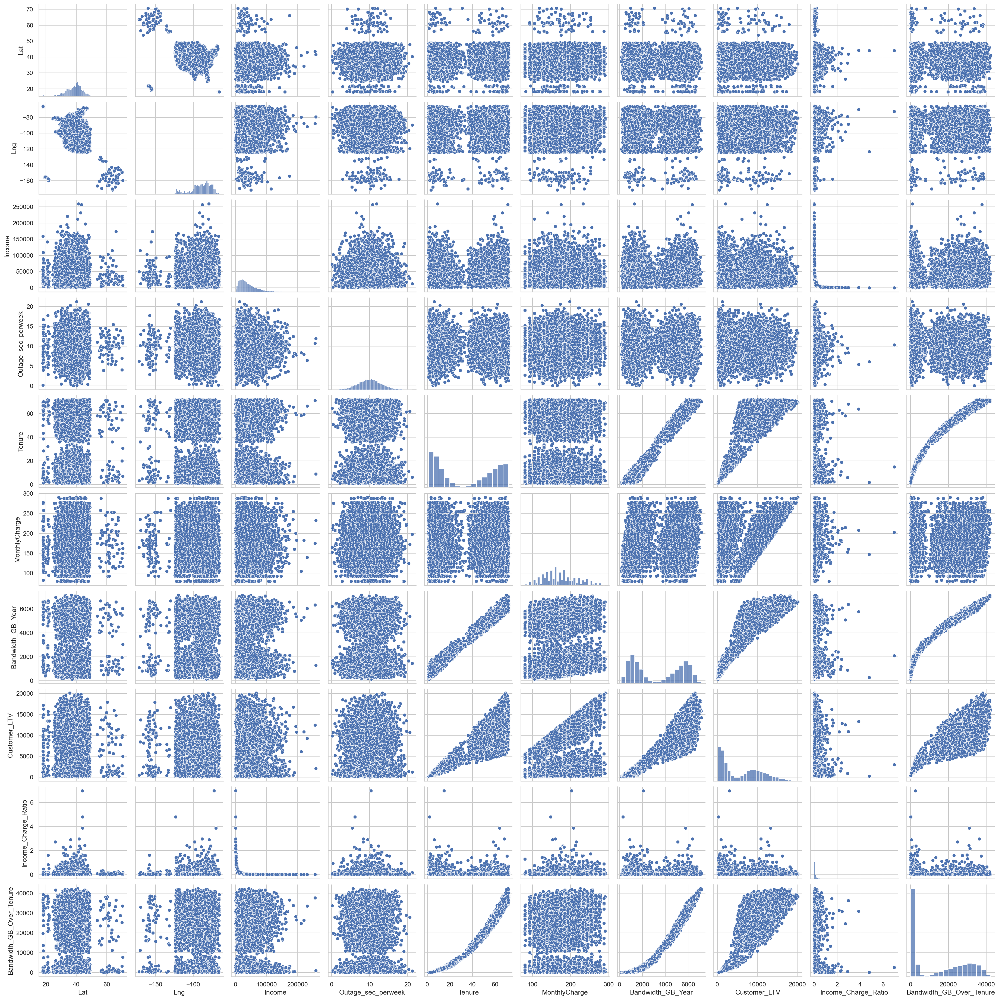

In [8]:
# Visualize data distributions and to check if the dataset forms pairs of columns that can be interesting for clustering:
sns.pairplot(explore_df.select_dtypes(["float64"]))


<AxesSubplot:xlabel='Income', ylabel='Tenure'>

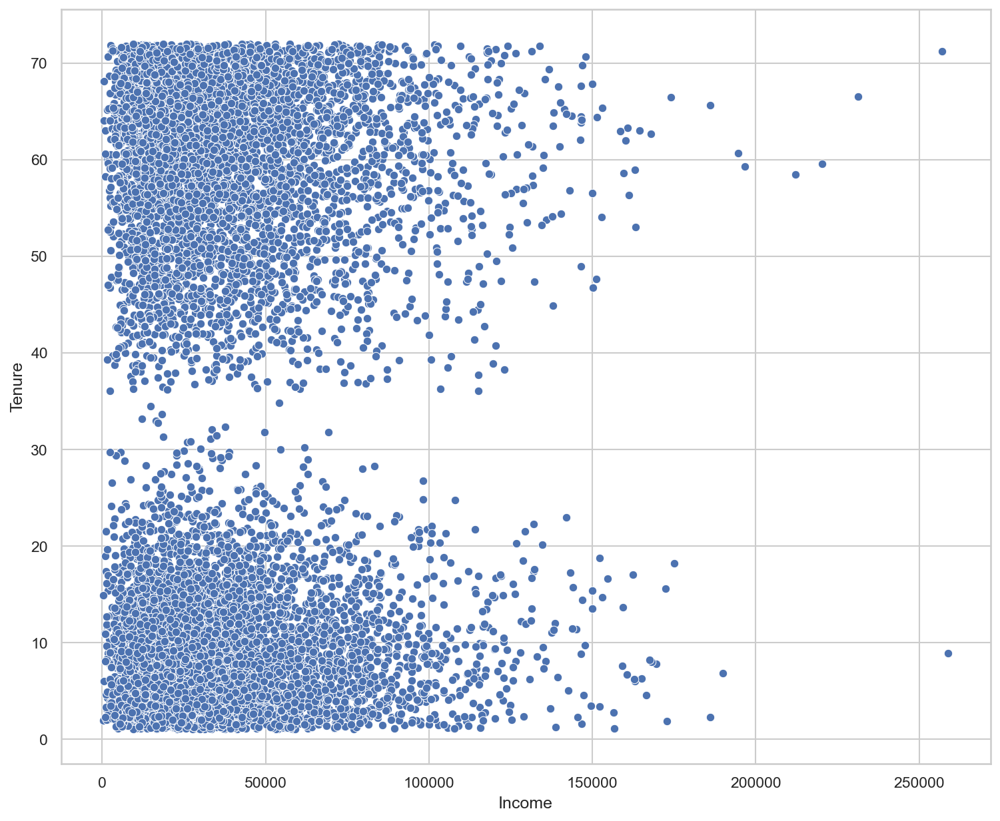

In [9]:
sns.scatterplot(data=explore_df, x="Income", y="Tenure")


<AxesSubplot:xlabel='Income', ylabel='Customer_LTV'>

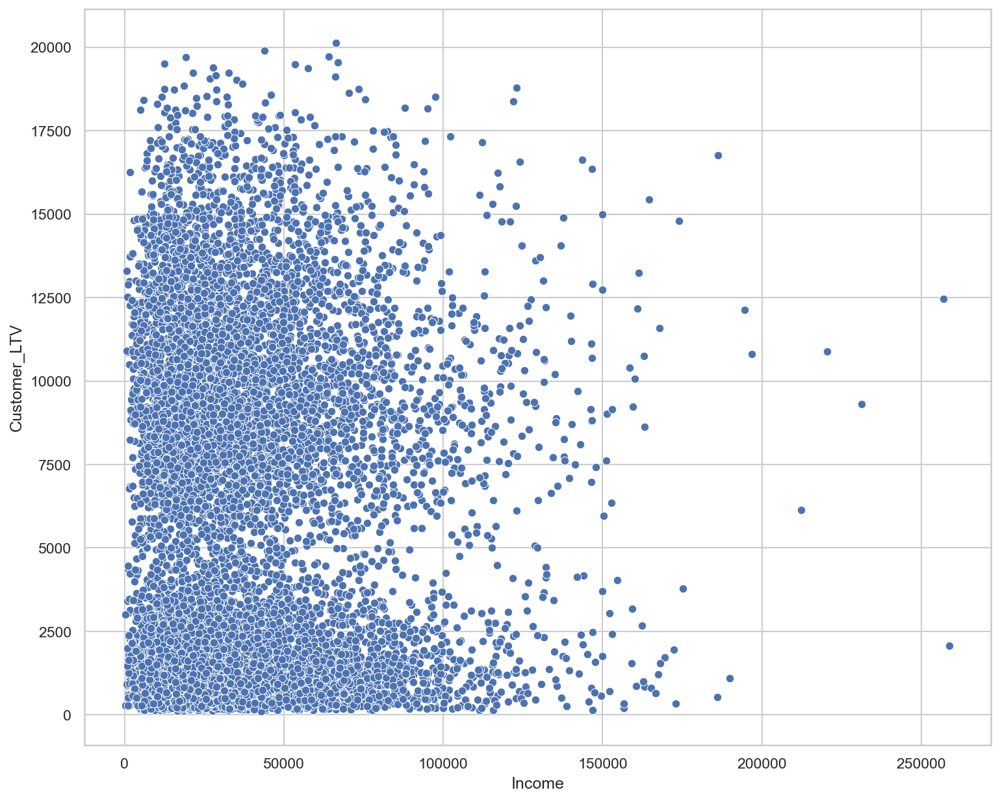

In [10]:
sns.scatterplot(data=explore_df, x="Income", y="Customer_LTV")


<AxesSubplot:xlabel='Bandwidth_GB_Year', ylabel='Income'>

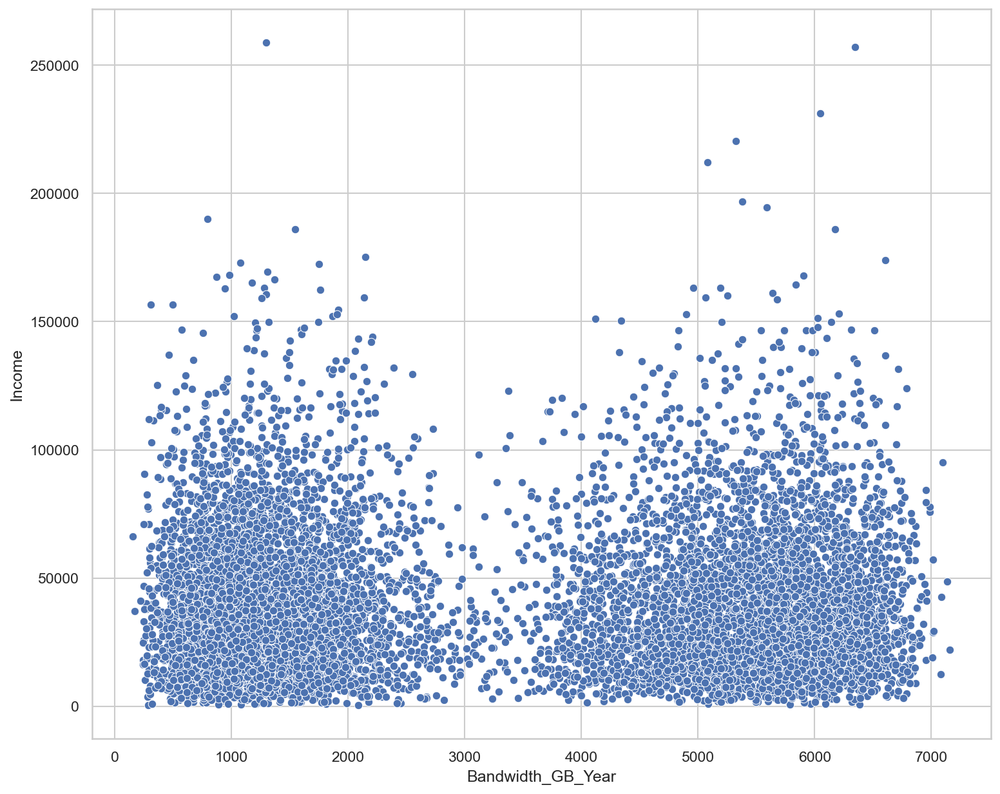

In [11]:
sns.scatterplot(data=explore_df, x="Bandwidth_GB_Year", y="Income")


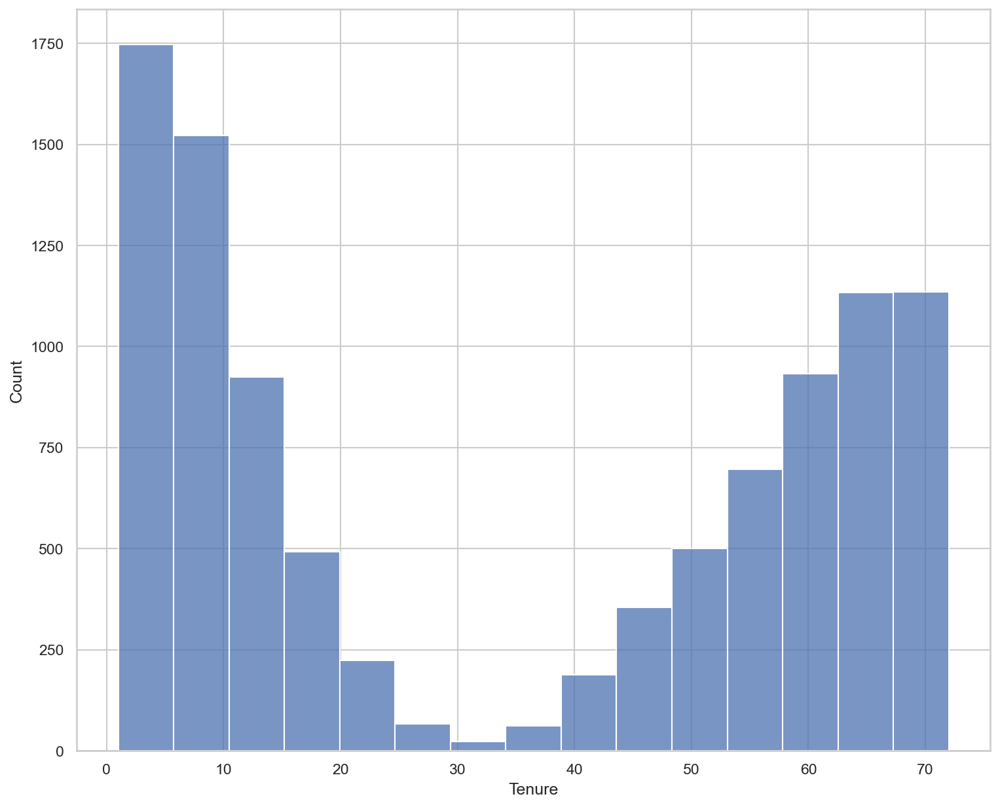

In [12]:
_ = sns.histplot(data=explore_df, x="Tenure")


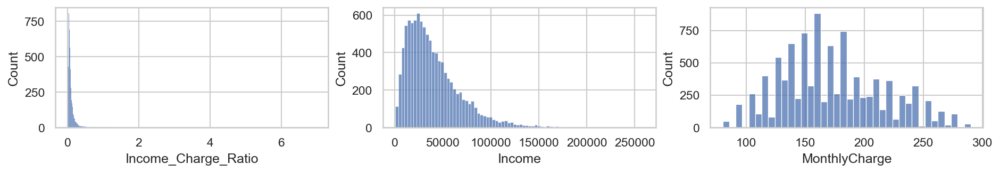

In [13]:
fig, axs = plt.subplots(ncols=3, figsize=(15, 2))

_ = sns.histplot(ax=axs[0], data=explore_df, x="Income_Charge_Ratio")
_ = sns.histplot(ax=axs[1], data=explore_df, x="Income")
_ = sns.histplot(ax=axs[2], data=explore_df, x="MonthlyCharge")


# Part I: Research Question
---
## A.  Describe the purpose of this data mining report by doing the following:

### 1.  Propose one question relevant to a real-world organizational situation that you will answer using one of the following clustering techniques:
> Gibson Telecom has recently received a high volume of customer complaints indicating that their services don't fit within lower-income customer budgets. To better understand the situation, Gibson Telecom is curious if the company has sufficient data to segment customers based on customer tenure and the percentage of their income spent on services and add-ons. More specifically, can Gibson use K-Means Clustering to identify customer groups that spend a significant portion of their income on services?


### 2.  Define one goal of the data analysis. Ensure that your goal is reasonable within the scope of the scenario and is represented in the available data.
> The primary goal of this analysis is to ensure Gibson Telecom remains competitive by providing affordable services to customers across all income levels. This goal will identify groups of similar customers based on their service charge to income ratio. These customer segments will enable Gibson Telecom to create multiple income-sensitive strategies and offers that provide affordable and competitive rates to customers before they churn. Ultimately, this approach seeks to improve customer retention and loyalty and understand how Gibson's pricing structures align with customer budgets.

# Part II: Technique Justification
---

## B.  Explain the reasons for your chosen clustering technique from part A1 by doing the following:

> We selected K-Means Clustering for our chosen clustering technique for several reasons. First, we're targeting between 2 to 4 clusters, so having to select the number of clusters before running the analysis is not a problem. Additionally, K-Means is an easy-to-implement, scalable, computationally-efficient algorithm (Li, 2019). Furthermore, this algorithm adapts to clusters of varying sizes and shapes (Google Developers).
    

### 1.  Explain how the clustering technique you chose analyzes the selected dataset. Include expected outcomes.
> The K-Means algorithm analyzes the selected dataset in several steps. After selecting the number of clusters, K, the algorithm places K data points into the data space such that each data point represents an initial cluster centroid. Next, the algorithm assigns each subsequent data point to the closest K. After assigning new data points to a cluster, the cluster recalculates and repositions the K centroid accordingly. The algorithm repeats the cluster assignment and centroid recalculation step until the centroids converge onto a consistent location (Techopedia, 2016).

> For our analysis, the K-Means algorithm will attempt to cluster customers based on their charges to income ratio and tenure. Once the algorithm converges, the expected outcome is 2 to 4 customer groups with similar characteristics. Each cluster should represent a group where grouped customers are as similar as possible, and customers in different groups are as dissimilar as possible (edureka, 2020).

> Lastly, we'll evaluate the quality of our cluster assignments using the sum of squared estimate of errors, which represents the "squared Euclidean distances of each point to its closest centroid" (Real Python & Arvai, 2021). The objective is to find a cluster assignment that minimizes the squared distances from each point to its centroid.The K-Means algorithm analyzes the selected dataset in several steps. After selecting the number of clusters, K, the algorithm places K data points into the data space such that each data point represents an initial cluster centroid. Next, the algorithm assigns each subsequent data point to the closest k. After assigning new data points to a cluster, the cluster recalculates and repositions the K centroid accordingly. The algorithm repeats the cluster assignment and centroid recalculation step until the centroids converge onto a consistent location (Techopedia, 2016).


### 2.  Summarize one assumption of the clustering technique.
> There are several assumptions about the K-Means clustering technique worth mentioning. Firstly, this algorithm is sensitive to outlier values and noisy data. Furthermore, outlier values make it more difficult for a centroid to converge to a location that yields a tight cluster. To overcome this pitfall, we're encouraged to perform an outlier analysis before the clustering analysis (Landup et al., 2022). It's also worth understanding that K-Means is better suited for smaller dimensional datasets and continuous data (Raghupathi, 2022). Conversely, K-means is not suitable for categorical data values since the Euclidean distance between a discrete point and its centroid isn't meaningful (Kumar, 2021).       


### 3.  List the packages or libraries you have chosen for Python or R, and justify how each item on the list supports the analysis.
We'll use several tools and technologies to support the K-Means clustering analysis. The primary tools we'll discuss are Jupyter Notebooks, NumPy, Matplotlib, Pandas, Python, Statistics, Seaborn, and Scikit-Learn. 

Jupyter Notebooks is beneficial because it offers seamless integration of python, data visualizations, and text documentation. Ultimately this offers human-readable and executable documents used to perform data analysis (Ingargiola, A., & contributors, 2015).

NumPy is beneficial because it serves as the de-facto Python Numerical programming package. NumPy is easy to use, offers extensive computing tools, and is optimized to work well on large data sets.

Matplotlib is a comprehensive library for creating visualizations in Python. Matplotlib offers a diverse set of visualization offers, but we're mainly going to leverage its plotting functionality to better understand our data set and evaluate the model.

Pandas' manipulation and analysis functions are immensely beneficial. More specifically, it provides a user-friendly API for interacting with, manipulating, and performing operations on various data structures and tabular data (Pandas, 2022).

I'm familiar with Python and currently use it every day at work. I’m familiar with the programming ecosystem, its libraries, and its tools.

Scikit-learn is a machine learning library that provides tools for model fitting, data preprocessing, feature selection, model selection, model pipelines, model evaluation, and many other utilities (scikit-learn developers, 2021). We'll use this package's modules to create a K-Means pipeline, impute data, scale data and evaluate the clustering model.

Like Matplotlib, Seaborn is beneficial because it's based on matplotlib and offers features to make data visualizations more attractive.

Statsmodels is beneficial because it provides functionality for estimating various statistical models and performing statistical tests and exploration. We'll use this package primarily to supplement Scikit-Learn and calculate the Z-Score of our variables (Perktold et al., 2018).

Lastly, we'll use the KneeLocator function from the kneed library to identify the elbow plot's elbow.

# Part III: Data Preparation
---

## C.  Perform data preparation for the chosen dataset by doing the following



###  1.  Describe one data preprocessing goal relevant to the clustering technique from part A1.
> Creating a K-Means clustering model requires several data preparation steps and manipulations. First, we'll need to compute what we're referring to as the Charge Percentage Income — this value represents the percentage of a customer's income spent on services at Gibson Telecom. Next, we'll remove unneeded data features that we're not going to use for our clustering. Then, we'll check for missing values and remove the records or impute the values using a median value. Additionally, we may need to standardize, normalize or scale the variables to avoid introducing bias into our clustering. This step will bring the data to the same magnitude and provide data with a mean of 0 and a standard deviation of 1 (AskPython, 2020).

### 2.  Identify the initial dataset variables that you will use to perform the analysis for the clustering question from part A1, and label each as continuous or categorical.

The initial dataset variables used to perform the analysis for the clustering question are:
- "Charge_Pct_Income" is a continuous variable.
- "Tenure" is a continuous variable.

In [ ]:
original_df["Charge_Pct_Income"] = (original_df.MonthlyCharge * 12) / original_df.Income


In [14]:
original_df["Customer_LTV"] = original_df.Tenure * original_df.MonthlyCharge
original_df["Bandwidth_GB_Over_Tenure"] = (
    original_df.Bandwidth_GB_Year / 12
) * original_df.Tenure


In [15]:
COLUMNS = ["Charge_Pct_Income", "Tenure"]

for c in sorted(original_df[COLUMNS]):
    v_type = (
        "continuous" if original_df[c].dtype in ["int64", "float64"] else "categorical"
    )
    print(f'"{c}" is a {v_type} variable.')


"Charge_Pct_Income" is a continuous variable.
"Tenure" is a continuous variable.


### 3.  Explain each of the steps used to prepare the data for the analysis. Identify the code segment for each step.

##### Drop Irrelevant Columns
> This step removes data features that won't be used in the model.

In [16]:
COLUMNS = ["Charge_Pct_Income", "Tenure"]

prep_df = original_df[COLUMNS]

display(prep_df.head())

prep_df.info()


,Charge_Pct_Income,Tenure
0,0.07,6.80
1,0.13,1.16
2,0.20,15.75
3,0.08,17.09
4,0.04,1.67


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 2 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Charge_Pct_Income  10000 non-null  float64
 1   Tenure             10000 non-null  float64
dtypes: float64(2)
memory usage: 156.4 KB


##### Remove Outliers
> This step removes outlier values with an absolute Z-Score exceeding a value of 3.

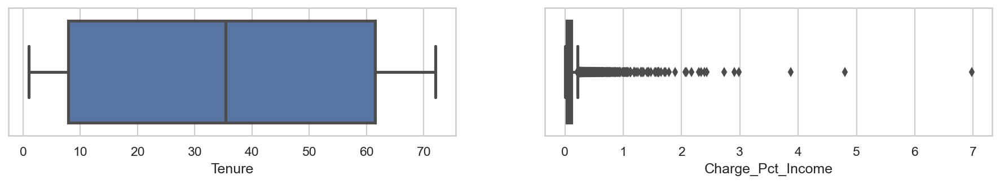

In [17]:
fig, axs = plt.subplots(ncols=2, figsize=(15, 2))
_ = sns.boxplot(data=prep_df, x="Tenure", ax=axs[0])
_ = sns.boxplot(data=prep_df, x="Charge_Pct_Income", ax=axs[1])
plt.show()


In [18]:
z = np.abs(stats.zscore(prep_df))

z_scores = stats.zscore(prep_df)

abs_z_scores = np.abs(z_scores)
filtered_entries = (abs_z_scores < 3).all(axis=1)
z_df = prep_df[filtered_entries]


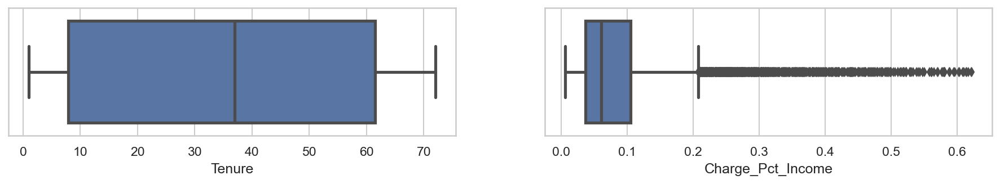

In [19]:
fig, axs = plt.subplots(ncols=2, figsize=(15, 2))
_ = sns.boxplot(data=z_df, x="Tenure", ax=axs[0])
_ = sns.boxplot(data=z_df, x="Charge_Pct_Income", ax=axs[1])
plt.show()


##### Impute Missing Values
*NOTE: actual transformation happens in Model Pipeline*
> This step uses sklearn.impute.SimpleImputer to find missing values and impute their values using the median value.

In [20]:
missing_df = pd.DataFrame(
    Pipeline(
        steps=[("imp", SimpleImputer(missing_values=np.nan, strategy="median"))]
    ).fit_transform(z_df),
    columns=z_df.columns,
)

missing_df.head()


,Charge_Pct_Income,Tenure
0,0.07,6.80
1,0.13,1.16
2,0.20,15.75
3,0.08,17.09
4,0.04,1.67


In [42]:
pd.DataFrame(
    {
        "# missing values": missing_df.isna().sum(),
        "% missing values": (missing_df.isna().sum() / len(missing_df)) * 100,
    }
)

,# missing values,% missing values
Charge_Pct_Income,0,0.00
Tenure,0,0.00


##### MinMax Scaler
*NOTE: actual transformation happens in Model Pipeline*
> This step uses sklearn.preprocessing.MinMaxScaler to scale the data, yielding variables that are within a range of zero and one. This approach is useful when the data's shape doesn't follow a normal distribution.

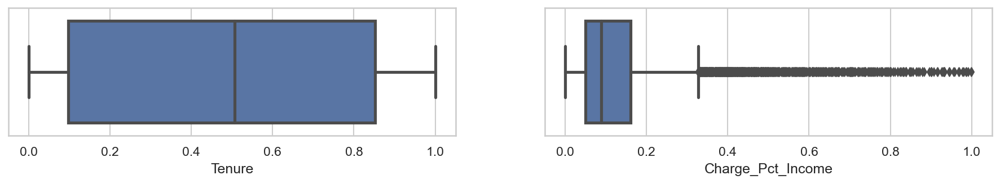

In [22]:
mm_df = pd.DataFrame(
    Pipeline(steps=[("scaler", MinMaxScaler())]).fit_transform(missing_df),
    columns=missing_df.columns,
)
mm_df.head()

fig, axs = plt.subplots(ncols=2, figsize=(15, 2))
_ = sns.boxplot(data=mm_df, x="Tenure", ax=axs[0])
_ = sns.boxplot(data=mm_df, x="Charge_Pct_Income", ax=axs[1])
plt.show()


##### Robust Scaler
*NOTE: actual transformation happens in Model Pipeline*
> This step uses sklearn.preprocessing.RobustScaler to scale the data, yielding variables scaled to the Interquartile Range.

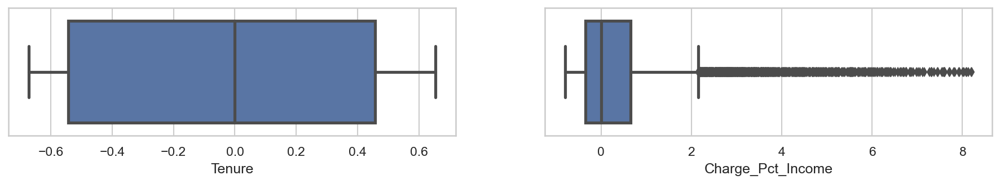

In [23]:
rob_df = pd.DataFrame(
    Pipeline(steps=[("scaler", RobustScaler())]).fit_transform(missing_df),
    columns=missing_df.columns,
)
rob_df.head()

fig, axs = plt.subplots(ncols=2, figsize=(15, 2))
_ = sns.boxplot(data=rob_df, x="Tenure", ax=axs[0])
_ = sns.boxplot(data=rob_df, x="Charge_Pct_Income", ax=axs[1])
plt.show()


##### Standardize Numeric Variables 
*NOTE: actual transformation happens in Model Pipeline*
> This step uses sklearn.preprocessing.StandardScaler to scale the data, yielding variables with a mean of 0 and a standard deviation of 1.    

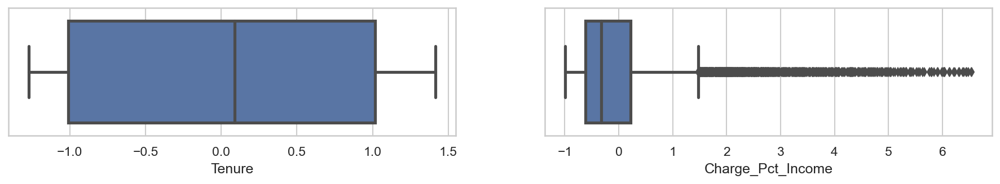

In [24]:
std_df = pd.DataFrame(
    Pipeline(steps=[("scaler", StandardScaler())]).fit_transform(missing_df),
    columns=missing_df.columns,
)
std_df.head()

fig, axs = plt.subplots(ncols=2, figsize=(15, 2))
_ = sns.boxplot(data=std_df, x="Tenure", ax=axs[0])
_ = sns.boxplot(data=std_df, x="Charge_Pct_Income", ax=axs[1])
plt.show()


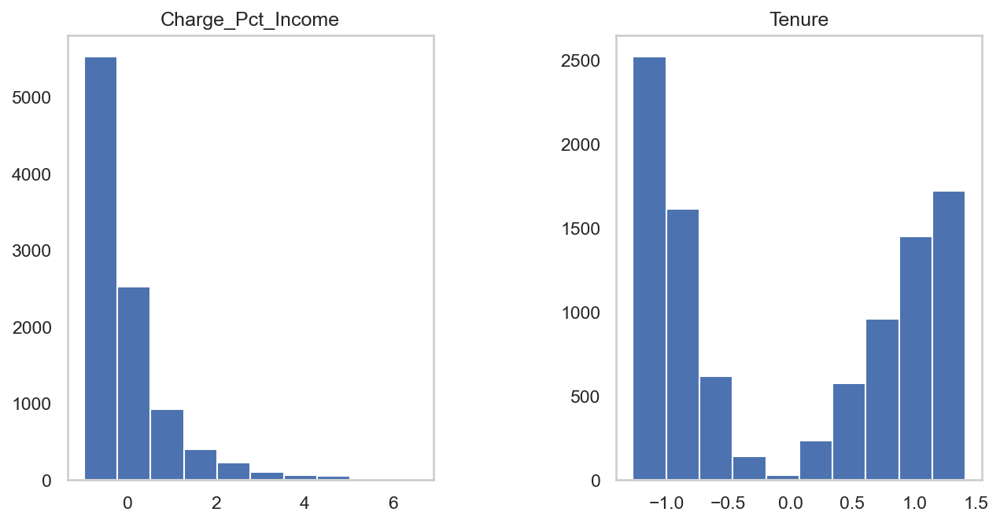

In [25]:
_ = std_df.hist(figsize=(10, 5), grid=False)
plt.subplots_adjust(hspace=0.5, wspace=0.5)


### 4.  Provide a copy of the cleaned dataset.
*The submission includes an accurate copy of the cleaned data set.*

In [26]:
missing_df.to_csv("./churn_data_prepared.csv", index=False)


# Part IV: Analysis
---
## D.  Perform the data analysis and report on the results by doing the following:



### 1.  Describe the analysis technique you used to appropriately analyze the data. Include screenshots of the intermediate calculations you performed.
> The technique used to analyze the data involved several steps. First, we loaded the prepared dataset into a dataframe. Next, we created a pipeline to scale the data and feed into the K-Means algorithm. Then we experimented with several cluster sizes ranging from 2 to 10 clusters — we took this approach to determine the appropriate cluster size. For each cluster size we captured the inertia value and the silhouette score  to later use in visualizations. Next we used the KneeLocator function to plot and determine where the elbow was on our visualizations. From there, we created two elbow curve lineplots with the x-axis representing the number of clusters and the y-axis representing an evaluation metric. One lineplot compared the number of clusters to that cluster's inertia, and the other compared the number of clusters to the Silhouette score. Next we visualized the elbow method and a scatterplot to visualize the generated clusters and their respective centroids. We then repeated these steps with different preprocessing scalers to determine the optimal scaler. Finally, we created a final K-Means cluster model using the desired scaler and number of clusters.


### 2.  Provide the code used to perform the clustering analysis technique from part 2.
 

In [45]:
# load the prepared data and reset the dataframe
df = pd.read_csv("./churn_data_prepared.csv")


In [46]:
def get_silhouette_df(scores):
    # displays the Silhouette Score for K-Means Clustering using different cluster counts
    
    num_clusters = range(2, 11)

    max_silh = pd.DataFrame(
        zip(num_clusters[1:], scores), columns=["# Clusters", "Silhoutte Score"]
    ).sort_values(by="Silhoutte Score", ascending=False)

    display("Largest Silhouette Score:", max_silh)


In [118]:
def compare_viz_elbows(num_clusters, kmeans_inertias, silhouettes):
    # plot the Elbow Chart and Silhouette Scores
    
    fig, axs = plt.subplots(ncols=2, figsize=(15, 8))

    p = sns.lineplot(num_clusters, kmeans_inertias, ax=axs[0])
    p.set_xlabel("# Clusters")
    p.set_ylabel("Cluster Inertia")
    p.axvline(kl.elbow, linestyle="--", color="r")

    p = sns.lineplot(num_clusters[1:], silhouettes, ax=axs[1])
    p.set_xlabel("# Clusters")
    p.set_ylabel("Cluster Silhoutte Score")
    p.axvline(kl.elbow, linestyle="--", color="r")

    plt.show()    
    


In [29]:
def compare_viz_clusters(scaler, data, X="Tenure", y="Charge_Pct_Income", n_clusters=2):
    # compare_viz_clusters allows for visualizing comparing original, clustered and scaled datasets
    
    # number of subplots columns
    ncols = 3 if scaler else 2

    cluster = KMeans(
        n_clusters=n_clusters, init="k-means++", random_state=RANDOM_STATE
    ).fit(data)
    
    if scaler:
        scaled_cluster = KMeans(
            n_clusters=n_clusters, init="k-means++", random_state=RANDOM_STATE
        ).fit(scaler().fit_transform(data))

        # inverse the scaler transformation to plot unscaled centers
        sc_centers = (
            scaler().fit(data).inverse_transform(scaled_cluster.cluster_centers_)
        )

    fig, axes = plt.subplots(nrows=1, ncols=ncols, figsize=(15, 5))

    # PLOT 1: original (unclustered) data     
    sns.scatterplot(ax=axes[0], data=data, x=X, y=y).set_title("Without Clustering")

    # PLOT 2: original data with cluster labels     
    sns.scatterplot(ax=axes[1], data=data, x=X, y=y, hue=cluster.labels_).set_title(
        "With the Elbow method"
    )
    
    # PLOT 2: cluster centers
    sns.scatterplot(
        ax=axes[1],
        y=cluster.cluster_centers_[:, 0],
        x=cluster.cluster_centers_[:, 1],
        color="red",
    )
     
    if scaler:
        # PLOT 3: scaled data clustered
        sns.scatterplot(
            ax=axes[2], data=data, x=X, y=y, hue=scaled_cluster.labels_
        ).set_title("With the Elbow method and Scaled Data")
        
        # PLOT 3: cluster centers for scaled data
        sns.scatterplot(ax=axes[2], y=sc_centers[:, 0], x=sc_centers[:, 1], color="red")


In [47]:
def viz_cluster(scaler, data, X="Tenure", y="Charge_Pct_Income", n_clusters=2):
    # viz_cluster allows for visualizing a single cluster
    
    scaled_cluster = KMeans(
        n_clusters=n_clusters, init="k-means++", random_state=RANDOM_STATE
    ).fit(scaler().fit_transform(data))

    # inverse the scaler transformation to plot unscaled centers
    sc_centers = scaler().fit(data).inverse_transform(scaled_cluster.cluster_centers_)

    # scaled cluster data    
    sns.scatterplot(data=data, x=X, y=y, hue=scaled_cluster.labels_).set_title(
        "With the Elbow method and Scaled Data"
    )
    
    # scaled cluster centers     
    sns.scatterplot(y=sc_centers[:, 0], x=sc_centers[:, 1], color="red")

#### Elbow Chart - No Scaler

'Largest Silhouette Score:'

,# Clusters,Silhoutte Score
0,3,0.84
1,4,0.72
2,5,0.61
3,6,0.59
4,7,0.58
5,8,0.57
7,10,0.56
6,9,0.56


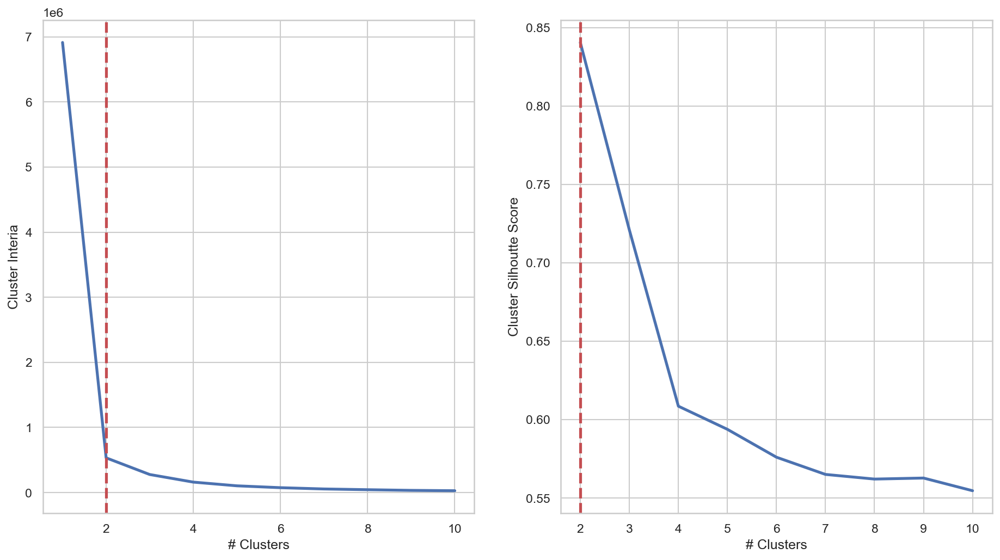

cluster [[ 0.08665921  9.108647  ]
 [ 0.08733351 59.93722047]]


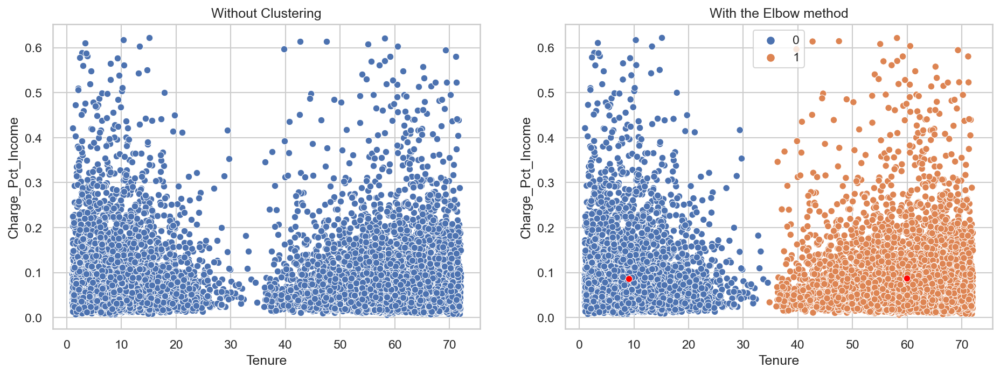

In [50]:
kmeans_inertias = []
silhouettes = []
num_clusters = range(1, 11)

# create a separate KMEANS pipeline with different cluster counts and store
# the inertia and silhoette score for each pipeline
for i in num_clusters:
    elbow_pipe = Pipeline(
        [
            ("imp", SimpleImputer(missing_values=np.nan, strategy="median")),
            (
                "kmeans",
                KMeans(
                    n_clusters=i,
                    init="k-means++",
                    n_init=50,
                    max_iter=500,
                    random_state=RANDOM_STATE,
                ),
            ),
        ]
    )

    out = elbow_pipe.fit_transform(df)

    kmeans_inertias.append(elbow_pipe["kmeans"].inertia_)

    # don't create silhouette score until we have more than 1 cluster     
    if i > 1:
        silhouettes.append(silhouette_score(out, elbow_pipe["kmeans"].labels_))

# find the Elbow        
kl = KneeLocator(
    x=num_clusters, y=kmeans_inertias, curve="convex", direction="decreasing"
)

get_silhouette_df(silhouettes)

# plot the Elbow Chart and Silhouette Scores
fig, axs = plt.subplots(ncols=2, figsize=(15, 8))

p = sns.lineplot(num_clusters, kmeans_inertias, ax=axs[0])
p.set_xlabel("# Clusters")
p.set_ylabel("Cluster Inertia")
p.axvline(kl.elbow, linestyle="--", color="r")

p = sns.lineplot(num_clusters[1:], silhouettes, ax=axs[1])
p.set_xlabel("# Clusters")
p.set_ylabel("Cluster Silhoutte Score")
p.axvline(kl.elbow, linestyle="--", color="r")

plt.show()

compare_viz_clusters(scaler=None, data=df, n_clusters=kl.elbow)


#### Elbow Chart - MinMaxScaler

'Largest Silhouette Score:'

,# Clusters,Silhoutte Score
0,3,0.80
1,4,0.68
3,6,0.50
2,5,0.48
4,7,0.48
5,8,0.45
6,9,0.44
7,10,0.43


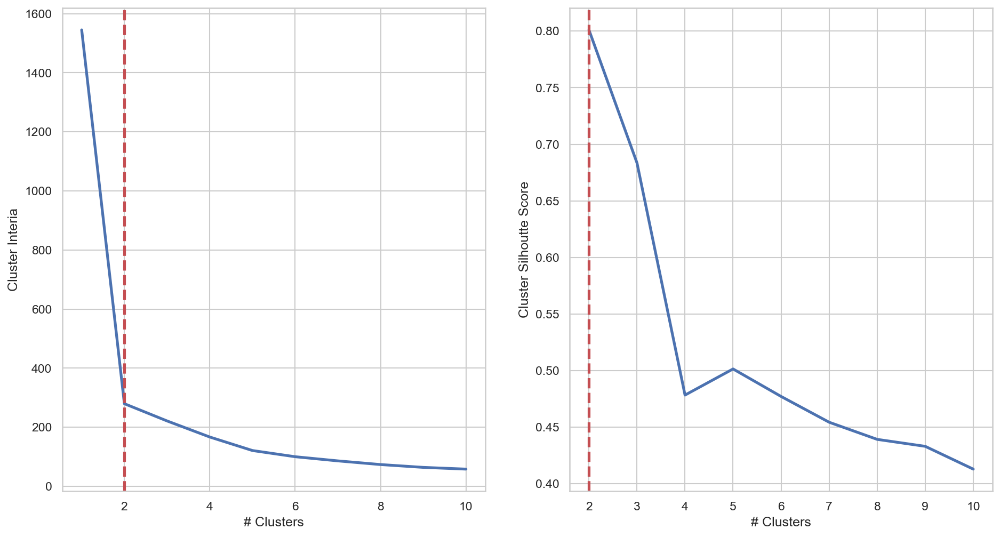

cluster [[ 0.08665921  9.108647  ]
 [ 0.08733351 59.93722047]]


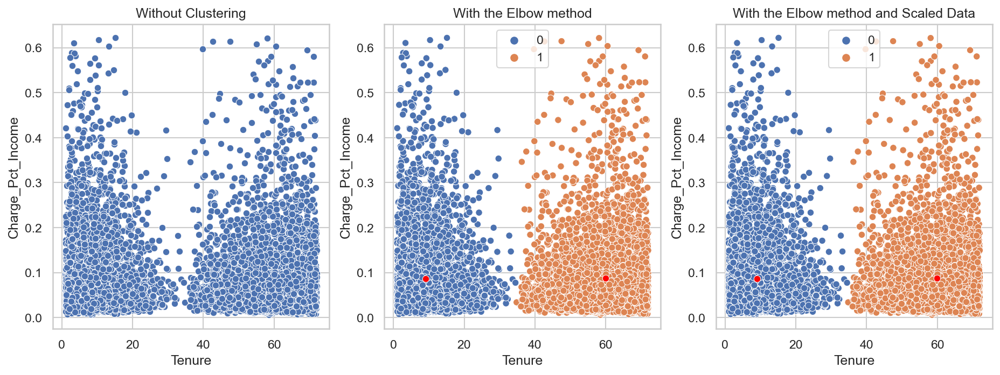

In [119]:
kmeans_inertias = []
silhouettes = []
num_clusters = range(1, 11)

# create a separate KMEANS pipeline with different cluster counts and store
# the inertia and silhoette score for each pipeline
for i in num_clusters:
    elbow_pipe = Pipeline(
        [
            ("imp", SimpleImputer(missing_values=np.nan, strategy="median")),
            ("scaler", MinMaxScaler()),
            (
                "kmeans",
                KMeans(
                    n_clusters=i,
                    init="k-means++",
                    n_init=50,
                    max_iter=500,
                    random_state=RANDOM_STATE,
                ),
            ),
        ]
    )

    out = elbow_pipe.fit_transform(df)

    kmeans_inertias.append(elbow_pipe["kmeans"].inertia_)

    # don't create silhouette score until we have more than 1 cluster         
    if i > 1:
        silhouettes.append(silhouette_score(out, elbow_pipe["kmeans"].labels_))

# find the Elbow           
kl = KneeLocator(
    x=num_clusters, y=kmeans_inertias, curve="convex", direction="decreasing"
)

get_silhouette_df(silhouettes)

compare_viz_elbows(num_clusters=num_clusters, kmeans_inertias=kmeans_inertias, silhouettes=silhouettes)

compare_viz_clusters(scaler=MinMaxScaler, data=df, n_clusters=kl.elbow)


#### Elbow Chart - StandardScaler

'Largest Silhouette Score:'

,# Clusters,Silhoutte Score
0,2,0.65
1,3,0.63
2,4,0.60
3,5,0.58
4,6,0.55
5,7,0.51
6,8,0.46
8,10,0.42
7,9,0.41


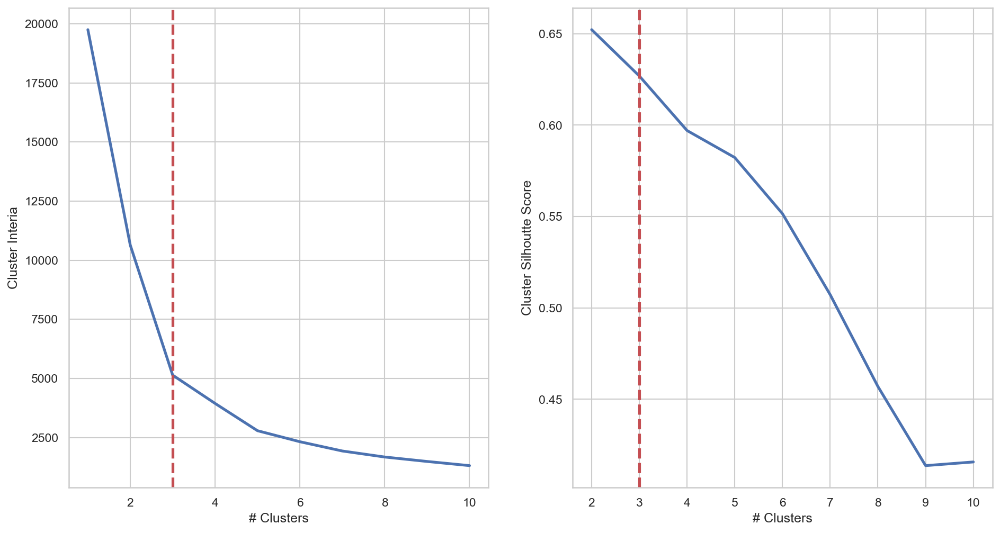

cluster [[ 0.08664023  9.02152256]
 [ 0.08613467 50.26500415]
 [ 0.08804732 65.32083193]]


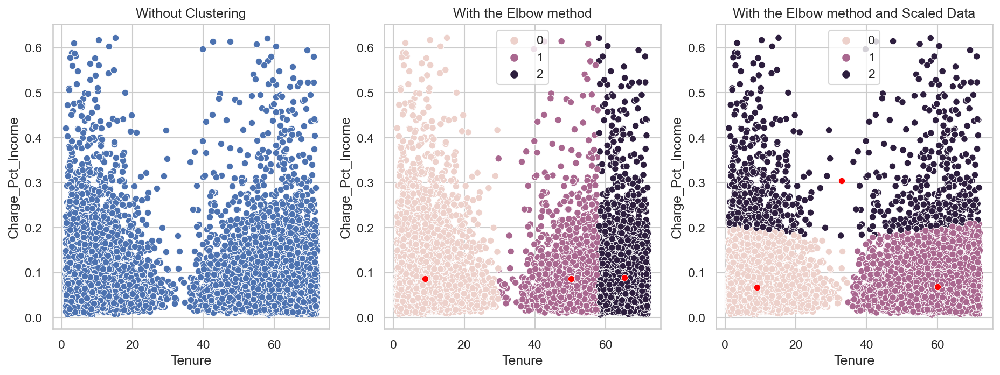

In [32]:
kmeans_inertias = []
silhouettes = []
num_clusters = range(1, 11)

# create a separate KMEANS pipeline with different cluster counts and store
# the inertia and silhoette score for each pipeline
for i in num_clusters:
    elbow_pipe = Pipeline(
        [
            ("imp", SimpleImputer(missing_values=np.nan, strategy="median")),
            ("scaler", StandardScaler()),
            (
                "kmeans",
                KMeans(
                    n_clusters=i,
                    init="k-means++",
                    n_init=50,
                    max_iter=500,
                    random_state=RANDOM_STATE,
                ),
            ),
        ]
    )

    out = elbow_pipe.fit_transform(df)

    kmeans_inertias.append(elbow_pipe["kmeans"].inertia_)

    # don't create silhouette score until we have more than 1 cluster         
    if i > 1:
        silhouettes.append(silhouette_score(out, elbow_pipe["kmeans"].labels_))

# find the Elbow           
kl = KneeLocator(
    x=num_clusters, y=kmeans_inertias, curve="convex", direction="decreasing"
)

get_silhouette_df(silhouettes)

compare_viz_elbows(num_clusters=num_clusters, kmeans_inertias=kmeans_inertias, silhouettes=silhouettes)

compare_viz_clusters(scaler=StandardScaler, data=df, n_clusters=kl.elbow)


#### Elbow Chart - RobustScaler

'Largest Silhouette Score:'

,# Clusters,Silhoutte Score
0,3,0.73
1,4,0.65
7,10,0.47
6,9,0.47
5,8,0.47
3,6,0.46
4,7,0.45
2,5,0.44


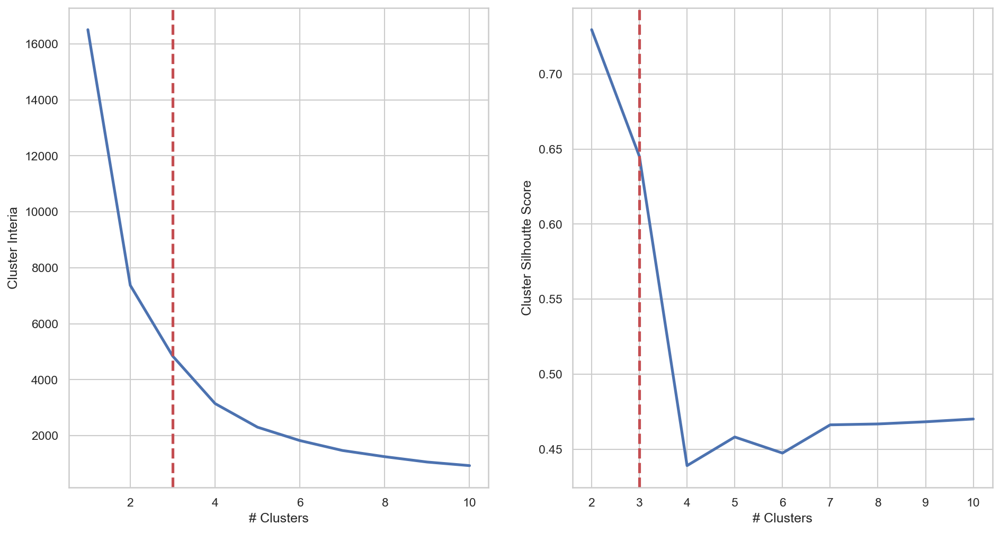

cluster [[ 0.08664023  9.02152256]
 [ 0.08613467 50.26500415]
 [ 0.08804732 65.32083193]]


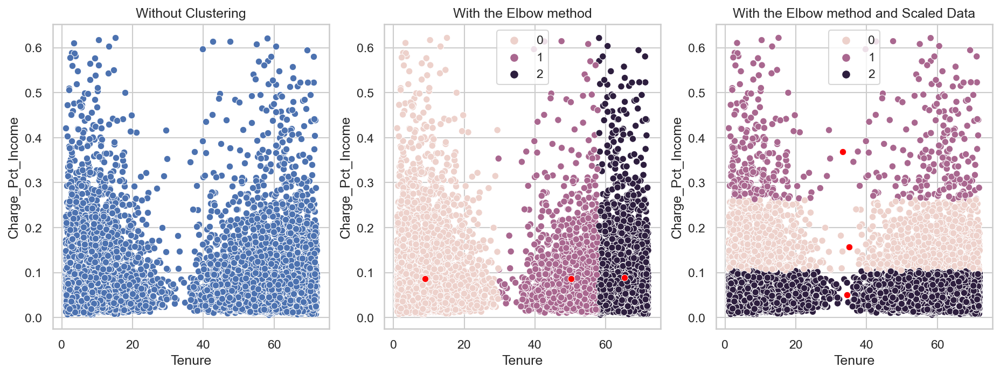

In [117]:
kmeans_inertias = []
silhouettes = []
num_clusters = range(1, 11)

# create a separate KMEANS pipeline with different cluster counts and store
# the inertia and silhoette score for each pipeline
for i in num_clusters:
    elbow_pipe = Pipeline(
        [
            ("imp", SimpleImputer(missing_values=np.nan, strategy="median")),
            ("scaler", RobustScaler()),
            (
                "kmeans",
                KMeans(
                    n_clusters=i,
                    init="k-means++",
                    n_init=50,
                    max_iter=500,
                    random_state=RANDOM_STATE,
                ),
            ),
        ]
    )

    out = elbow_pipe.fit_transform(df)

    kmeans_inertias.append(elbow_pipe["kmeans"].inertia_)

    # don't create silhouette score until we have more than 1 cluster         
    if i > 1:
        silhouettes.append(silhouette_score(out, elbow_pipe["kmeans"].labels_))

# find the Elbow           
kl = KneeLocator(
    x=num_clusters, y=kmeans_inertias, curve="convex", direction="decreasing"
)

get_silhouette_df(silhouettes)

compare_viz_elbows(num_clusters=num_clusters, kmeans_inertias=kmeans_inertias, silhouettes=silhouettes)

compare_viz_clusters(scaler=RobustScaler, data=df, n_clusters=kl.elbow)


#### Final Model

In [101]:
%%time

FINAL_SCALER = RobustScaler

data_prep_pipe = Pipeline(
    [
        ("imp", SimpleImputer(missing_values=np.nan, strategy="median")), 
        ("scaler", FINAL_SCALER()),        
    ]
)

FINAL_PIPE = Pipeline(
    [
       ("data_prep", data_prep_pipe),      
       (
           "kmeans",
           KMeans(
               n_clusters=2,
               init="k-means++",
               n_init=50,
               max_iter=500,
               random_state=RANDOM_STATE,
           ),
       ),        
    ]
)

FINAL_OUTPUT_DF = pd.DataFrame(FINAL_PIPE.fit_transform(df))


CPU times: user 1.6 s, sys: 830 ms, total: 2.43 s
Wall time: 557 ms


#### Silhouette Score

The silhouette coefficient is a measure of cluster cohesion and separation. Silhouette coefficient values range between -1 and 1. Larger numbers indicate that samples are closer to their clusters than they are to other clusters. It quantifies how well a data point fits into its assigned cluster based on two factors:

- How close the data point is to other points in the cluster
- How far away the data point is from points in other clusters


In [102]:
silhouette_score(
    X=FINAL_PIPE["data_prep"].fit_transform(df), labels=FINAL_PIPE["kmeans"].labels_
).round(3)


0.645

#### Inertia

In [120]:
round(FINAL_PIPE["kmeans"].inertia_)


7374

#### Cluster Counts

In [104]:
counts_df = pd.DataFrame(df.copy())
counts_df["cluster"] = FINAL_PIPE["kmeans"].predict(df)

display(counts_df.groupby("cluster").count())



,Charge_Pct_Income,Tenure
cluster,,
1,9876,9876


In [105]:
counts_df

,Charge_Pct_Income,Tenure,cluster
0,0.07,6.80,1
1,0.13,1.16,1
2,0.20,15.75,1
3,0.08,17.09,1
4,0.04,1.67,1
...,...,...,...
9871,0.03,68.20,1
9872,0.07,61.04,1
9873,0.04,47.42,1
9874,0.18,71.10,1


#### Cluster Visualization and Counts

,0,1
0,2.82,0.54
1,1.97,1.22
2,0.98,2.04
3,2.73,0.38
4,3.23,0.66
...,...,...
9871,3.37,0.75
9872,2.80,0.52
9873,3.18,0.36
9874,1.34,1.88


pipe["kmeans"].labels_ [1 1 0 ... 1 0 0]
LOWEST SSE 7373.675995591471
CENTERS [[ 2.94018302 -0.02587492]
 [ 0.02661896 -0.0476044 ]]
ITERATIONS 3
kmeans.labels_[:5] [1 1 0 1 1]
CPU times: user 482 ms, sys: 268 ms, total: 750 ms
Wall time: 191 ms


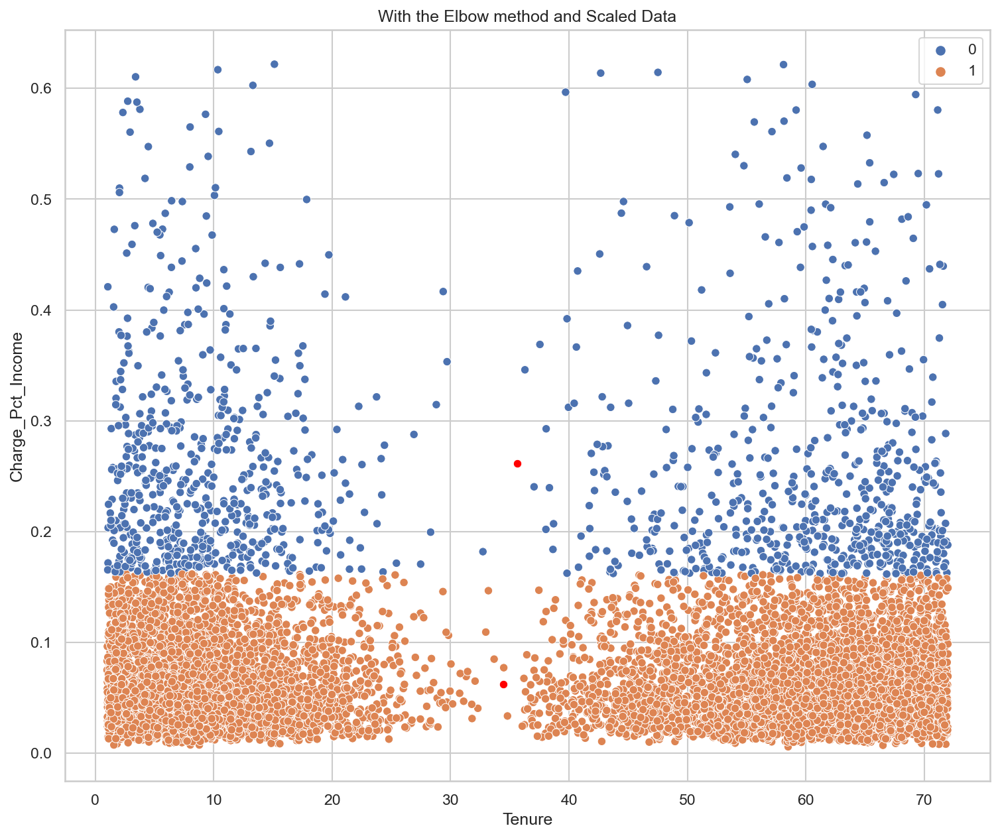

In [106]:
%%time

kmeans = FINAL_PIPE["kmeans"]
# kmeans = KMeans(n_clusters=kl.elbow, **kmeans_kwargs)
# kmeans.fit(df)

display(pd.DataFrame(FINAL_OUTPUT_DF))

print('pipe["kmeans"].labels_', FINAL_PIPE["kmeans"].labels_)

# plot clusters
# sns.scatterplot(data=df, y = "Charge_Pct_Income", x = "Tenure", hue=FINAL_PIPE["kmeans"].labels_)

# plot cluster centers
# sns.scatterplot(y=FINAL_PIPE["kmeans"].cluster_centers_[:, 0], x=FINAL_PIPE["kmeans"].cluster_centers_[:, 1], color="red")

plt.show()

# The lowest SSE value
# Sum of squared distances of samples to their closest cluster center, weighted by the sample weights if provided.
print("LOWEST SSE", kmeans.inertia_)


# Final locations of the centroid
print("CENTERS", kmeans.cluster_centers_)

# The number of iterations required to converge
print("ITERATIONS", kmeans.n_iter_)

# Finally, the cluster assignments are stored as a one-dimensional NumPy array in kmeans.labels_. Here’s a look at the first five predicted labels:
print("kmeans.labels_[:5]", kmeans.labels_[:5])

viz_cluster(scaler=FINAL_SCALER, data=df, X = "Tenure", y = "Charge_Pct_Income", n_clusters=2)

cluster [[ 0.08665921  9.108647  ]
 [ 0.08733351 59.93722047]]


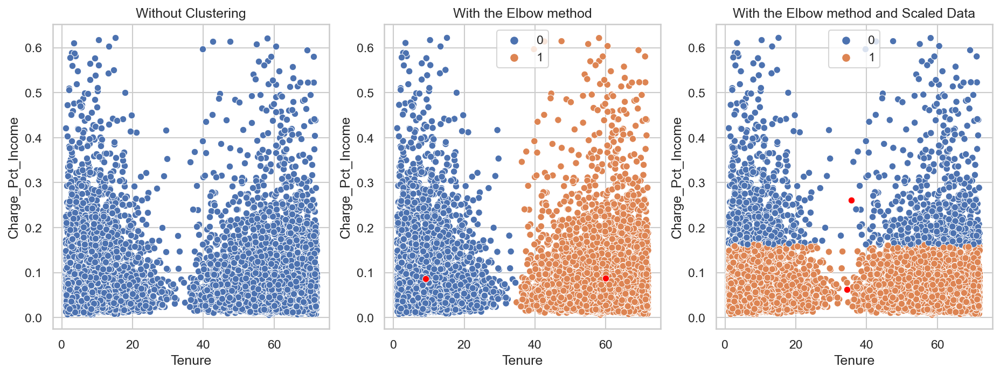

In [107]:
compare_viz_clusters(scaler=FINAL_SCALER, data=df, n_clusters=2)

Text(0, 0.5, 'Inertia')

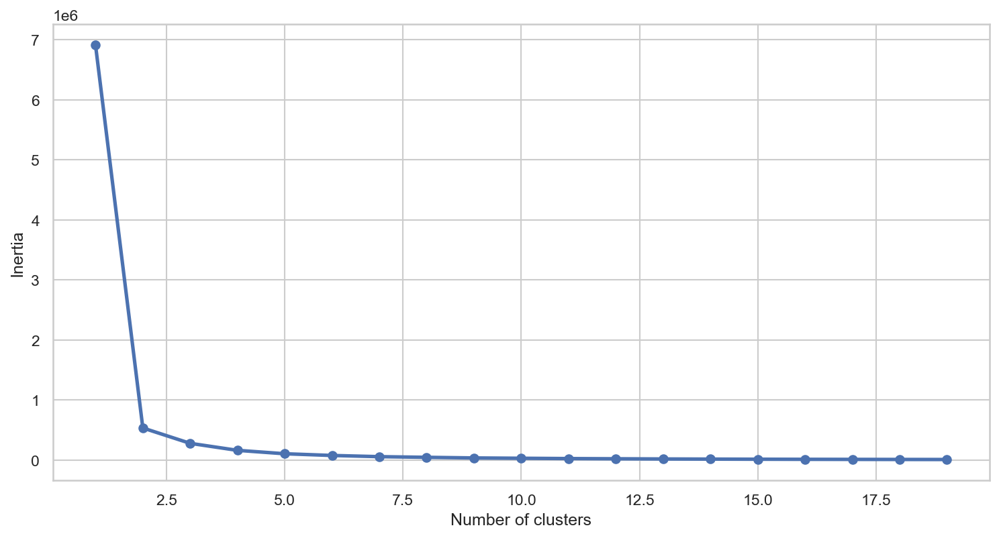

In [40]:
# We will first fit multiple k-means models and in each successive model, we will increase the number of clusters. We will store the inertia value of each model and then plot it to visualize the result:

# fitting multiple k-means algorithms and storing the values in an empty list
SSE = []
for cluster in range(1, 20):
    kmeans = KMeans(n_clusters=cluster, init="k-means++")
    kmeans.fit(df)
    SSE.append(kmeans.inertia_)

# converting the results into a dataframe and plotting them
frame = pd.DataFrame({"Cluster": range(1, 20), "SSE": SSE})
plt.figure(figsize=(12, 6))
plt.plot(frame["Cluster"], frame["SSE"], marker="o")
plt.xlabel("Number of clusters")
plt.ylabel("Inertia")


# Part V: Data Summary and Implications

## E.  Summarize your data analysis by doing the following:



### ✅ 1.  Explain the accuracy of your clustering technique.
> The accuracy of this K-Means clustering technique was assessed by using the cluster's Inertia and Silhouette Score. The inertia metric represents how far apart data points are within a cluster — the goal is to form tight clusters with a small inertia value. We calculate this metric by summing the intracluster distance of all cluster data points from the cluster centroid. Then, we sum this value for all clusters (Sharma, 2022). Our final modal saw an Inertia of 7,374.

> The silhouette score uses two factors to describe cluster cohesion and separation and ultimately how well a data point fits into its assigned cluster. The first factor measures how close a data point is to other cluster data points. The second factor measure how far away a data point is from other clusters. A silhouette score can range from -1 to 1 — Larger values describe data points that are closer to other cluster data points than to data points in other clusters. Furthermore, dense clusters that are well separated from other clusters have a higher silhouette score (scikit-learn developers). Our final modal saw a Silhouette Score of 0.645.

### 2.  Discuss the results and implications of your clustering analysis.
> The results and implications of your clustering analysis are as follows. The K-Means clustering algorithm uncovered two distinct customers. One cluster at the bottom of the scatterplot represents customers that spend less than 16% of their income on Gibson services. The other cluster represents customers spending more than 16% of their income on services. It's worth noting that there is a significantly larger variation in this cluster — some customers spend over 60% of their income on services. Interestingly, our algorithm determined that further dividing these clusters in half based on customers with short and long tenures didn't optimize the cluster inertias.





### ✅ 3.  Discuss one limitation of your data analysis.
> There are several data-related limitations to this analysis. Analyzing the percentage of income spent on Gibson Telecom services would've been more accurate if the data set included the combined income for the "heads of household." This information is important because a customer with a lower income may not be the primary income earner in the household. Consequently, this analysis could falsely conclude that this customer is spending a significant portion of their net income at Gibson Telecom when their total charges at Gibson would be much smaller when using the head of household income. Additionally, customer income is a self-reported metric, so there's no guarantee that the provided information is factual, calculated correctly, or up to date. Lastly, it's unclear when the income data was collected or last updated. 



### 4.  Recommend a course of action for the real-world organizational situation from part A1 based on your results and implications discussed in part E2.

> Our analysis sought to discover if Gibson analysts could use K-Means Clustering to segment customers based on how much of their income they spent on services. We successfully clustered Gibson customers and uncovered an imbalance between customer income levels and monthly charge distributions. Despite having a normal distribution of Monthly Charges, the distribution of Income levels is positively skewed. Ideally, the percent of a customer's income spent on Gibson's services would remain consistent across income ranges.

> Consequently, I recommend reevaluating some of our pricing tiers to ensure they align with the median customer's budget. When the Charge % to Income Ratio increases, we risk straining customer budgets and potentially increasing churn as customers seek more affordable options. Additionally, we could reach out to customers with a high Charge % to Income Ratio and recommend they reduce services they're not actively using. This approach reduces revenue but would likely increase customer lifetime value and prevent customers from churning if they believe Gibson has their pocketbook in their best interests.

> Unfortunately, the analysis only uncovered two clusters instead of three to four. We can perform future analysis using other normalization approaches and PCA to determine if more data features are needed to better segment customers.

# Part VI: Demonstration



## F.  Provide a Panopto video recording that includes a demonstration of the functionality of the code used for the analysis and a summary of the programming environment.
 

Note: The audiovisual recording should feature you visibly presenting the material (i.e., not in voiceover or embedded video) and should simultaneously capture both you and your multimedia presentation.
 

Note: For instructions on how to access and use Panopto, use the "Panopto How-To Videos" web link provided below. To access Panopto's website, navigate to the web link titled "Panopto Access," and then choose to log in using the “WGU” option. If prompted, log in using your WGU student portal credentials, and then it will forward you to Panopto’s website.
 

To submit your recording, upload it to the Panopto drop box titled “Data Mining II – OFM3.” Once the recording has been uploaded and processed in Panopto's system, retrieve the URL of the recording from Panopto and copy and paste it into the Links option. Upload the remaining task requirements using the Attachments option.

## G.  Record the web sources used to acquire data or segments of third-party code to support the analysis. Ensure the web sources are reliable.

- https://stackabuse.com/k-means-clustering-with-scikit-learn/
- https://realpython.com/k-means-clustering-python/
- https://www.geeksforgeeks.org/k-means-clustering-with-scipy/?ref=rp
- https://docs.scipy.org/doc/scipy/reference/cluster.vq.html?highlight=scipy%20cluster%20vq#module-scipy.cluster.vq
- https://stackabuse.com/k-means-clustering-with-the-elbow-method/

## H.  Acknowledge sources, using in-text citations and references, for content that is quoted, paraphrased, or summarized.

AskPython. (2020, October 13). 2 Easy Ways to Standardize Data in Python for Machine Learning. AskPython. Retrieved June 25, 2022, from https://www.askpython.com/python/examples/standardize-data-in-python 

edureka. (2020, July 24). Understanding K-means Clustering with Examples. Edureka. Retrieved August 15, 2022, from https://www.edureka.co/blog/k-means-clustering/ edureka. (2020, July 24). 

Google Developers. (n.d.). k-Means Advantages and Disadvantages. Google. Retrieved August 15, 2022, from https://developers.google.com/machine-learning/clustering/ 

Kumar, S. (2021, May 22). Clustering algorithm for data with mixed categorical and numerical features. Medium. Retrieved August 15, 2022, from https://towardsdatascience.com/clustering-algorithm-for-data-with-mixed-categorical-and-numerical-features-d4e3a48066a0 

Li, L. (2019, June 4). K-means clustering with scikit-learn. Medium. Retrieved August 15, 2022, from https://towardsdatascience.com/k-means-clustering-with-scikit-learn-6b47a369a83c 

Perktold, J., Seabold, S., Taylor, J., & statsmodels-developers. (2018). Welcome to Statsmodels’s Documentation. StatsModels. Retrieved May 25 2022, from https://www.statsmodels.org/v0.10.1/

Raghupathi, K. (2022, March 31). 10 interesting use cases for the k-means algorithm - dzone AI. dzone.com. Retrieved August 15, 2022, from https://dzone.com/articles/10-interesting-use-cases-for-the-k-means-algorithm 

Real Python, & Arvai, K. (2021, January 8). K-means clustering in Python: A practical guide. Real Python. Retrieved August 15, 2022, from https://realpython.com/k-means-clustering-python/ 

Sampaio, C. (2022, July 21). Definitive guide to K-means clustering with Scikit-learn. Stack Abuse. Retrieved August 15, 2022, from https://stackabuse.com/k-means-clustering-with-scikit-learn/ 

scikit-learn developers. (n.d.). Sklearn.metrics.silhouette_samples. scikit. Retrieved August 17, 2022, from https://scikit-learn.org/stable/modules/generated/sklearn.metrics.silhouette_samples.html#sklearn.metrics.silhouette_samples 

Sharma, P. (2022, June 15). K means clustering: K means clustering algorithm in Python. Analytics Vidhya. Retrieved August 17, 2022, from https://www.analyticsvidhya.com/blog/2019/08/comprehensive-guide-k-means-clustering/ 

Techopedia. (2016, November 30). K-Means Clustering. Techopedia.com. Retrieved August 15, 2022, from https://www.techopedia.com/definition/32057/k-means-clustering
--- 

AskPython. (2020, October 13). 2 Easy Ways to Standardize Data in Python for Machine Learning. AskPython. Retrieved June 25, 2022, from https://www.askpython.com/python/examples/standardize-data-in-python 

Bevans, R. (2020, October 26). An introduction to multiple linear regression. Scribbr. Retrieved June 25, 2022, from https://www.scribbr.com/statistics/multiple-linear-regression/

Bowne-Anderson, H. (2016, April 25). Preprocessing in Data Science (Part 1): Centering, Scaling, and KNN. DataCamp. Retrieved June 25, 2022, from https://www.datacamp.com/tutorial/preprocessing-in-data-science-part-1-centering-scaling-and-knn 

Brownlee, J. (2020, June 11). How to develop elastic net regression models in Python. Machine Learning Mastery. Retrieved June 25, 2022, from https://machinelearningmastery.com/elastic-net-regression-in-python/ 

Brownlee, J. (2020, October 10). How to develop ridge regression models in Python. Machine Learning Mastery. Retrieved June 25, 2022, from https://machinelearningmastery.com/ridge-regression-with-python/ 

Brownlee, J. (2021, October 5). How to develop lasso regression models in Python. Machine Learning Mastery. Retrieved June 25, 2022, from https://machinelearningmastery.com/lasso-regression-with-python/ 

Dobbins, T., Burke, J., & LearnDataSci. (2022). Predicting Housing Prices with Linear Regression using Python, pandas, and statsmodels. Learn Data Science - Tutorials, Books, Courses, and More. Retrieved June 25, 2022, from https://www.learndatasci.com/tutorials/predicting-housing-prices-linear-regression-using-python-pandas-statsmodels/  

Godwin, J. A. (2021, April 2). Regularization and linear regression. Medium. Retrieved June 25, 2022, from https://towardsdatascience.com/regularization-and-linear-regression-bcaeba547c46 

Ingargiola, A., & contributors. (2015). What is the Jupyter Notebook. 1. What is the Jupyter Notebook? - Jupyter/IPython Notebook Quick Start Guide 0.1 documentation. Retrieved June 25, 2022, from https://jupyter-notebook-beginner-guide.readthedocs.io/en/latest/what_is_jupyter.html 

Kumar, A. (2022, May 18). Mean squared error or r-squared - which one to use? Data Analytics. Retrieved June 25, 2022, from https://vitalflux.com/mean-square-error-r-squared-which-one-to-use/ 

Pandas. Pandas Documentation - pandas 1.4.1 documentation. (2022). Retrieved June 25, 2022, from https://pandas.pydata.org/docs/index.html 

Perktold, J., Seabold, S., Taylor, J., & statsmodels-developers. (2018). Welcome to Statsmodels’s Documentation. StatsModels. Retrieved May 25 2022, from https://www.statsmodels.org/v0.10.1/

scikit-learn developers. (2021). Getting started. Getting Started — scikit-learn 1.0.2 documentation. Retrieved June 25, 2022, from https://scikit-learn.org/stable/getting_started.html  

Wikipedia. (2022, June 19). Elastic net regularization. Wikipedia. Retrieved June 25, 2022, from https://en.wikipedia.org/wiki/Elastic_net_regularization 
